# Knowledge transfer across species

In this notebook we perform the task of cross-species annotation using scTOP package. We use 80% of one species data to construct a basis to annotate the test set and other seven species. In order to be able to compare different species, we use orthology to map the genes from the seven species being annotated to the species used to create a basis.

First, we load the necessary packages and the spermatogenesis dataset for each species using the built-in function from transcriptformer

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import scanpy as sc
import anndata as ad
import plotly.io as pio
import sys
import os
sys.path.append('/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/Vilker_Helper_Files/scTOP')
%load_ext autoreload
%autoreload 1
%aimport SimilarityHelper
%aimport TopObject
%aimport CriticalityHelper
pio.renderers.default = 'notebook'

Now, we define a function that map each species genes to the basis species.

In [30]:
basisCollection = "/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/OutsidePaperObjects/Bases/BasisCollection.csv"
# lungMAP = SimilarityHelper.loadBasis(basisCollection=basisCollection, basisName="LungMAPANOVA",
#                                          basisKeep=["AT2", "AT1", "Basal", "Ciliated", "Goblet", "Secretory"]
# )
# lungMAP2500 = SimilarityHelper.loadBasis(basisCollection=basisCollection, basisName="LungMAP2500",
#                                          basisKeep=["AT2", "AT1", "Basal", "Ciliated", "Goblet", "Secretory"]
# )
# lungMAP500 = SimilarityHelper.loadBasis(basisCollection=basisCollection, basisName="LungMAP500",
#                                          basisKeep=["AT2", "AT1", "Basal", "Ciliated", "Goblet", "Secretory"]
# )
# HaberMAPANOVA1 = SimilarityHelper.loadBasis(basisCollection=basisCollection, basisName="HaberMAPANOVA1",
#                                          #basisKeep=["AT2", "AT1", "Basal", "Ciliated", "Goblet", "Secretory"]
# )
# HaberMAP500ANOVA2 = SimilarityHelper.loadBasis(basisCollection=basisCollection, basisName="HaberMAP500ANOVA2",
#                                          #basisKeep=["AT2", "AT1", "Basal", "Ciliated", "Goblet", "Secretory"]
# )
PPFEMAP1733ANOVA02 = SimilarityHelper.loadBasis(basisCollection=basisCollection, basisName="PPFEMAP1733ANOVA02",
                                         #basisKeep=["AT2", "AT1", "Basal", "Ciliated", "Goblet", "Secretory"]
)

Loaded PPFEMAP1733ANOVA02 basis!


In [12]:
habermann = TopObject.TopObject("Habermann", keep=True, skipProcess=True)
habermann.setBasis()
habermann.basis.drop(columns=["Proliferating Epithelial Cells", "Transitional AT2", "SCGB3A2+"], inplace=True)
# habermann.combineBases(lungMAP, firstKeep=["KRT5-/KRT17+"], name="LungMAP")
habermann.combineBases(lungMAP500, firstKeep=["KRT5-/KRT17+"], name="LungMAP500")

Setting AnnData object...
Setting AnnData...
Setting metadata and df...
Filtering TopObject...
Setting AnnData...
Setting metadata and df...
Finished filtering!
Finished setup!
Setting basis...


100%|██████████| 8/8 [00:07<00:00,  1.05it/s]


Basis set!
Combining bases...


,KRT5-/KRT17+,AT1,AT2,Basal,Ciliated,Goblet,Secretory
gene,,,,,,,
FAM138A,-0.004691,-0.004913,-0.004962,-0.005298,-0.005823,-0.005616,-0.005273
OR4F5,-0.004691,-0.004913,-0.004962,-0.005298,-0.000665,-0.005616,-0.005273
FAM87B,0.001186,-0.004913,-0.004962,-0.005298,-0.001495,-0.005616,-0.005273
LINC00115,0.001629,-0.000429,0.001381,0.001655,0.001281,0.001785,0.001889
FAM41C,-0.004691,0.000433,0.001381,0.003909,0.003024,0.002697,0.001482
...,...,...,...,...,...,...,...
AC023491.2,-0.004691,-0.004913,-0.004962,-0.005298,-0.000665,-0.005616,-0.005273
AC233755.2,-0.004691,-0.004913,-0.004962,-0.005298,-0.005823,-0.005616,-0.005273
AC233755.1,0.000545,-0.004913,-0.004962,-0.005298,-0.005823,-0.005616,-0.000280


In [15]:
habermann.combinedBases["LungMAP500"].to_csv("../OutsidePaperObjects/Bases/HaberMAP500.csv")

In [4]:
basisSpecies, targetSpecies = ("human", "mouse")
ensemblMart, ensemblConfig = TopObject.getEnsemblMart(speciesNames=[basisSpecies, targetSpecies])
mapping = TopObject.getOrthologMapping(basisSpecies, targetSpecies, ensemblMart, ensemblConfig)
mapping

Generating mapping...
Finding orthologs...


1 input query terms found no hit:	['ENSMUSG00000034007']
1 input query terms found no hit:	['ENSG00000168078']


,test,basis
0,mt-Nd1,MT-ND1
1,mt-Nd2,MT-ND2
2,mt-Co1,MT-CO1
3,mt-Co2,MT-CO2
4,mt-Atp8,MT-ATP8
...,...,...
18242,Bpifa1,BPIFA1
18243,Bpifb1,BPIFB1
18244,Col5a1,COL5A1
18245,Fcnb,FCN1


# Bibek

In [59]:
bibek.getOrthologs(mapping, inplace=True)

1 input query terms found no hit:	['ENSMUSG00000034007']
1 input query terms found no hit:	['ENSG00000168078']
/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Setting AnnData...
Setting metadata and df...


AnnData object with n_obs × n_vars = 26717 × 13958
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mito', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.1.5', 'SCT_snn_res.1.25', 'SCT_snn_res.1', 'SCT_snn_res.0.75', 'SCT_snn_res.0.5', 'SCT_snn_res.0.25', 'seurat_clusters', 'SCT_snn_res.0.2', 'SCT_snn_res.0.15', 'SCT_snn_res.0.1', 'SCT_snn_res.0.05', 'S.Score', 'G2M.Score', 'Phase', 'old.ident', 'iAEC2.differentiation.8genes', 'iAEC2.maturation.5genes', 'differ_long', 'matura_long', 'Hb_AT1', 'Hb_AT2', 'Hb_B.Cells', 'Hb_Basal', 'Hb_Ciliated', 'Hb_Differentiating.Ciliated', 'Hb_Endothelial.Cells', 'Hb_Fibroblasts', 'Hb_HAS1.High.Fibroblasts', 'Hb_KRT5neg.KRT17pos', 'Hb_Lymphatic.Endothelial.Cells', 'Hb_MUC5ACpos.High', 'Hb_MUC5Bpos', 'Hb_Macrophages', 'Hb_Mast.Cells', 'Hb_Mesothelial.Cells', 'Hb_Monocytes', 'Hb_Myofibroblasts', 'Hb_NK.Cells', 'Hb_PLIN2pos.Fibroblasts', 'Hb_Plasma.Cells', 'Hb_Proliferating.Epithelial.Cells', 'Hb_Proliferating.Macrophages', 'Hb_Proliferating.T.Ce

In [160]:
bibek.project(lungMAP500, "LungMAP500")
# bibek.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")

Projecting onto basis...
Finished projecting! 13854 genes were in both the source and basis.


,AAACCCACAACTCCCT_1_1,AAACCCACATCTAACG_1_1,AAACGAAGTCACCTTC_1_1,AAACGAAGTCACTCGG_1_1,AAACGAATCGTGCACG_1_1,AAACGCTAGATAACGT_1_1,AAACGCTTCACTGAAC_1_1,AAAGAACTCGGTAACT_1_1,AAAGGATGTCCGGACT_1_1,AAAGGATTCGTTCTGC_1_1,...,TTTGACTAGTAATTGG-1_8,TTTGACTGTAGTACGG-1_8,TTTGACTTCTGCTCTG-1_8,TTTGGAGCACAAAGTA-1_8,TTTGGTTCACCCTATC-1_8,TTTGGTTTCGCTAATG-1_8,TTTGTTGAGGAATGTT-1_8,TTTGTTGCATGACCCG-1_8,TTTGTTGTCGAACCAT-1_8,TTTGTTGTCTTGTGCC-1_8
AT1,0.164523,0.025171,0.251188,0.117774,0.517692,0.032835,0.041398,-0.009888,0.136614,0.112611,...,-0.036221,0.469415,0.397875,-0.049184,0.195874,0.110248,0.071997,0.128530,0.457009,-0.005658
AT2,0.368390,0.394210,0.241464,0.374173,0.062810,0.396720,0.392671,0.443303,0.375981,0.376758,...,0.053747,0.212298,0.113487,0.472291,0.089347,0.410939,0.407026,0.396187,0.035436,0.369142
Basal,0.025232,0.005584,0.085339,-0.015510,0.062245,-0.023043,-0.045941,-0.029392,-0.042897,-0.009579,...,0.054623,-0.014392,0.106580,-0.008800,0.074676,0.002903,0.008468,0.004910,0.111211,0.024419
Ciliated,-0.074875,-0.047241,-0.085193,-0.070251,-0.110815,-0.051581,-0.014598,-0.048160,-0.038754,-0.057423,...,0.652434,-0.116607,-0.052140,-0.071404,0.019761,-0.084798,-0.055236,-0.060351,-0.047394,-0.056793
Goblet,0.135441,0.084928,0.124918,0.130866,0.150183,0.154943,0.153978,0.160457,0.139840,0.151443,...,-0.103905,0.133656,0.114797,0.144501,0.004654,0.149138,0.106962,0.156476,0.013512,0.133606
Secretory,-0.062636,0.039499,-0.023306,-0.013490,-0.100383,0.008071,-0.006335,-0.006039,-0.044958,-0.053325,...,-0.138003,-0.063559,-0.071907,0.067048,-0.002006,-0.021212,0.003116,-0.029701,-0.042518,0.088908


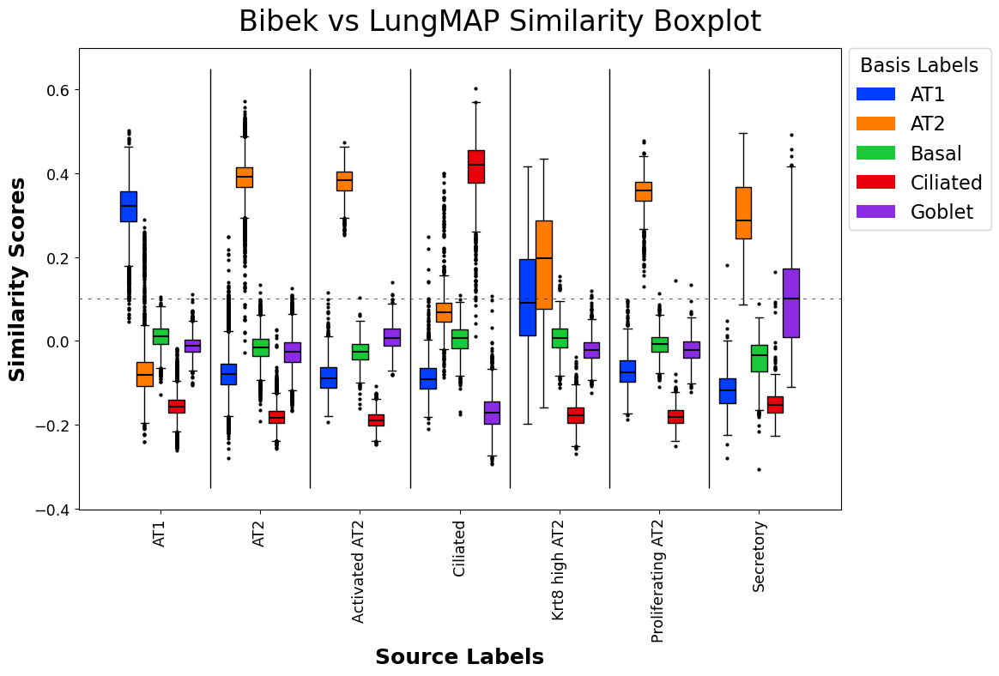

In [63]:
includeCriteria = None
bibekSimilarityMap = SimilarityHelper.getMatchingProjections(bibek, "LungMAP", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(bibekSimilarityMap, 
        title="Bibek vs LungMAP Similarity Boxplot",
        # outFile="../PendingResults/Bibek vs LungMAP Boxplot.png"
)

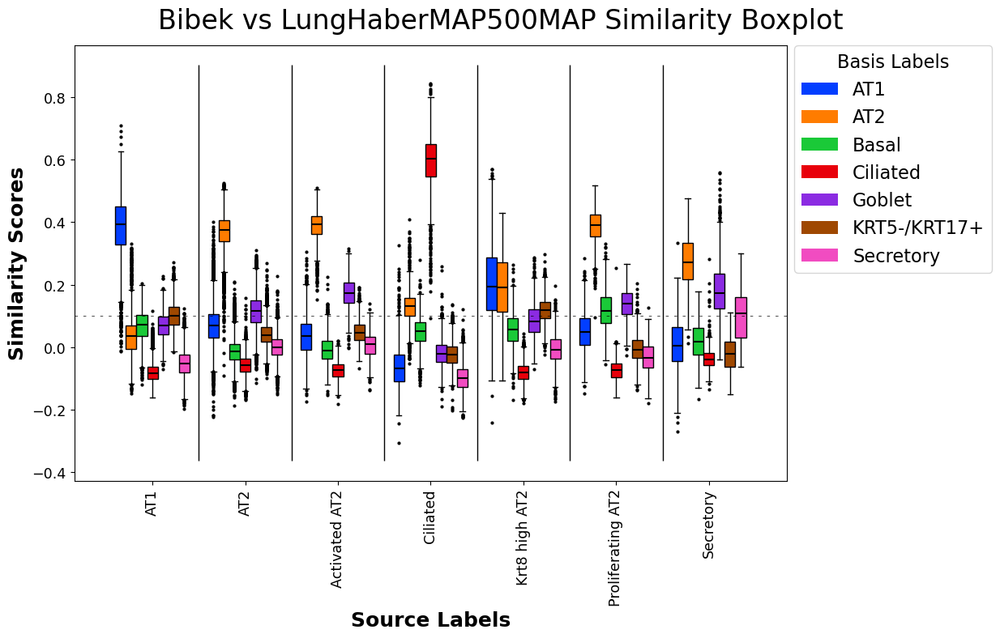

In [158]:
includeCriteria = None
bibekSimilarityMap = SimilarityHelper.getMatchingProjections(bibek, "HaberMAP500", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(bibekSimilarityMap, 
        title="Bibek vs LungHaberMAP500MAP Similarity Boxplot",
        # outFile="../PendingResults/Bibek vs LungMAP Boxplot.png"
)

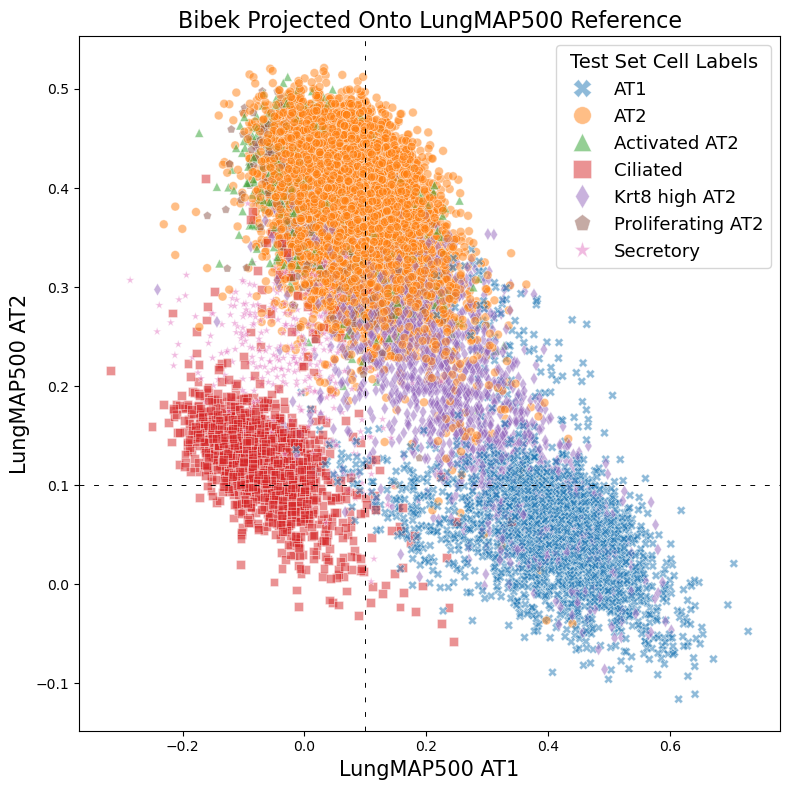

In [161]:
ax = SimilarityHelper.plotTwo(bibek, "LungMAP500", "AT1", "AT2",
                             # outFile="../PendingResults/Bibek vs LungMAP AT1 vs AT2.png",
)

# Planer

In [16]:
planer = TopObject.TopObject("Planer", skipProcess=True)
planer.getOrthologs(mapping, inplace=True)

Setting AnnData object...
Setting AnnData...
Setting metadata and df...
Finished setup!
Filtering AnnData object for orthologs...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Dropping duplicates...
Setting AnnData...
Setting metadata and df...
Done!


AnnData object with n_obs × n_vars = 12430 × 17140
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'scrublet_score', 'scrublet_call', 'ident', 'cxds_score', 'cxds_call', 'bcds_score', 'bcds_call', 'hybrid_score', 'hybrid_call', 'percent.mito', 'S.Score', 'G2M.Score', 'Phase', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.2', 'SCT_snn_res.0.4', 'SCT_snn_res.0.6', 'SCT_snn_res.0.8', 'SCT_snn_res.1', 'seurat_clusters', 'var_cluster', 'SiteA', 'SiteB', 'tam_day', 'sac_day', 'sex_f', 'exp_group', 'trace_ratio', 'trace_call', 'celltype', 'nCount_counts', 'nFeature_counts'
    var: 'name'
    obsm: 'X_pca', 'X_umap'

In [31]:
# planer.project(habermann.combinedBases["LungMAP500"].drop(["Goblet", "Secretory"], axis=1), "HaberMAP500")
# planer.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")
# planer.project(HaberMAP500ANOVA2, "HaberMAP500ANOVA2")
planer.project(PPFEMAP1733ANOVA02, "PPFEMAP1733ANOVA02")
# planer.project(lungMAP500, "lungMAP500")

Projecting onto basis...
Finished projecting! 2536 genes were in both the source and basis.


,H1N1_02to06dpi_AAATGGACAGCTTCGG_1,H1N1_02to06dpi_AAATGGATCCATCTCG_1,H1N1_02to06dpi_AACAAAGAGCGGGTAT_1,H1N1_02to06dpi_AACCCAATCATTTGCT_1,H1N1_02to06dpi_AACCTGACACTCTCGT_1,H1N1_02to06dpi_AACGGGAGTACCGTGC_1,H1N1_02to06dpi_AACTTCTTCACCGACG_1,H1N1_02to06dpi_AAGAACAAGTTCATCG_1,H1N1_02to06dpi_AAGACAACACCGCTGA_1,H1N1_02to06dpi_AAGCGAGCATTATGCG_1,...,H1N1_07to366dpi_TTGTTCATCTCTTAAC_25,H1N1_07to366dpi_TTTATGCGTAGCGTTT_25,H1N1_07to366dpi_TTTCACAAGCGATTCT_25,H1N1_07to366dpi_TTTCAGTCATCAGTCA_25,H1N1_07to366dpi_TTTCCTCTCCGCCTAT_25,H1N1_07to366dpi_TTTCGATAGGAACGCT_25,H1N1_07to366dpi_TTTCGATTCAAGTCGT_25,H1N1_07to366dpi_TTTGACTAGAGCATAT_25,H1N1_07to366dpi_TTTGGTTTCATACGGT_25,H1N1_07to366dpi_TTTGTTGAGACTTGTC_25
AT1,0.063055,-0.002913,0.027371,0.015010,0.020803,0.143592,0.043586,0.011832,0.050380,0.022308,...,0.032276,0.108878,0.028649,-0.033051,0.033891,0.036141,0.031253,0.126386,0.146634,-0.010663
AT2,0.104058,0.017914,0.149297,-0.001468,0.128529,0.008459,0.140711,0.032895,0.096284,0.116540,...,0.009633,0.060020,-0.009998,0.049311,0.140707,0.143260,0.136951,0.082816,0.029984,0.017042
Aberrant_Basaloid,0.044404,-0.019318,0.005028,0.021048,0.038916,0.065969,0.020257,-0.025044,0.030592,0.030567,...,0.010445,0.021182,0.028504,-0.027454,0.009640,0.018114,0.012932,0.057815,0.057570,-0.012706
Basal,0.060514,0.064887,0.042327,0.032974,0.012308,0.022068,0.055352,0.036858,0.062289,0.008247,...,0.065641,0.038240,0.054739,0.068977,0.042766,0.045401,0.059792,0.041961,0.064212,0.058173
Ciliated,-0.092554,0.174075,-0.076682,0.145327,-0.062664,-0.053997,-0.066176,0.185093,-0.067040,-0.053994,...,0.210045,-0.044939,-0.040628,0.143703,-0.075386,-0.069842,-0.071067,-0.083058,-0.074927,0.231150
Goblet,0.019903,0.035703,0.023494,0.008610,0.016276,0.014651,-0.004400,0.011457,0.021242,0.002537,...,0.005193,0.017371,0.002532,0.010016,0.020381,0.015348,0.016670,0.009727,0.014470,0.012902
Secretory,0.048321,0.026182,0.065852,0.022562,0.045798,-0.005939,0.033365,0.013150,0.043680,0.036743,...,-0.001378,-0.000771,0.033614,0.002160,0.057874,0.053186,0.049493,0.019740,-0.007829,0.012111


Similarity map built!


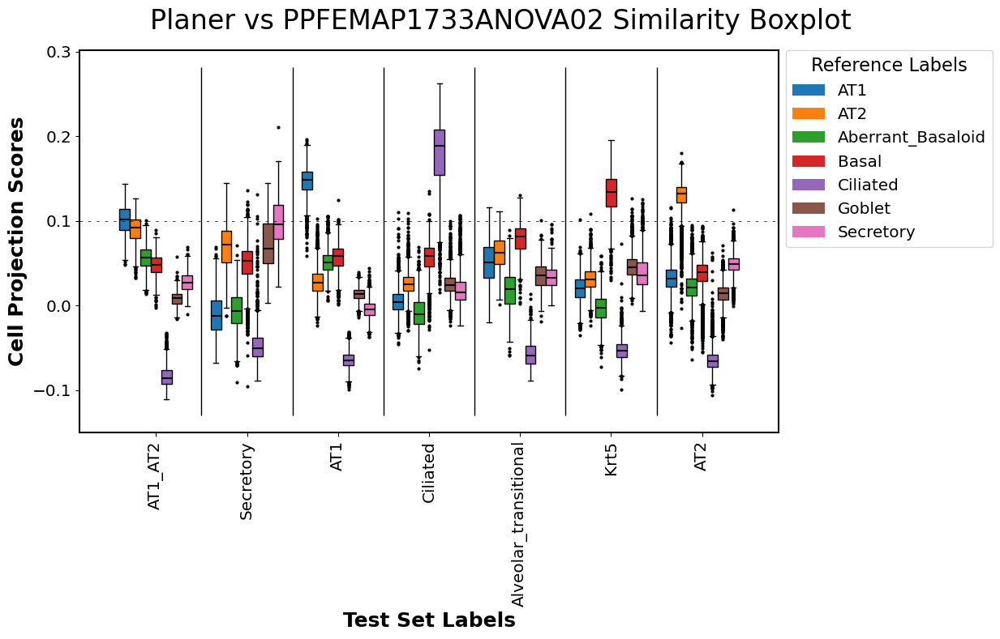

In [32]:
includeCriteria = None
SimilarityMap = SimilarityHelper.getMatchingProjections(planer, "PPFEMAP1733ANOVA02", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(SimilarityMap, 
        title="Planer vs PPFEMAP1733ANOVA02 Similarity Boxplot",
        # outFile="../PendingResults/Planer vs HaberMAP 500 Boxplot.png"
)

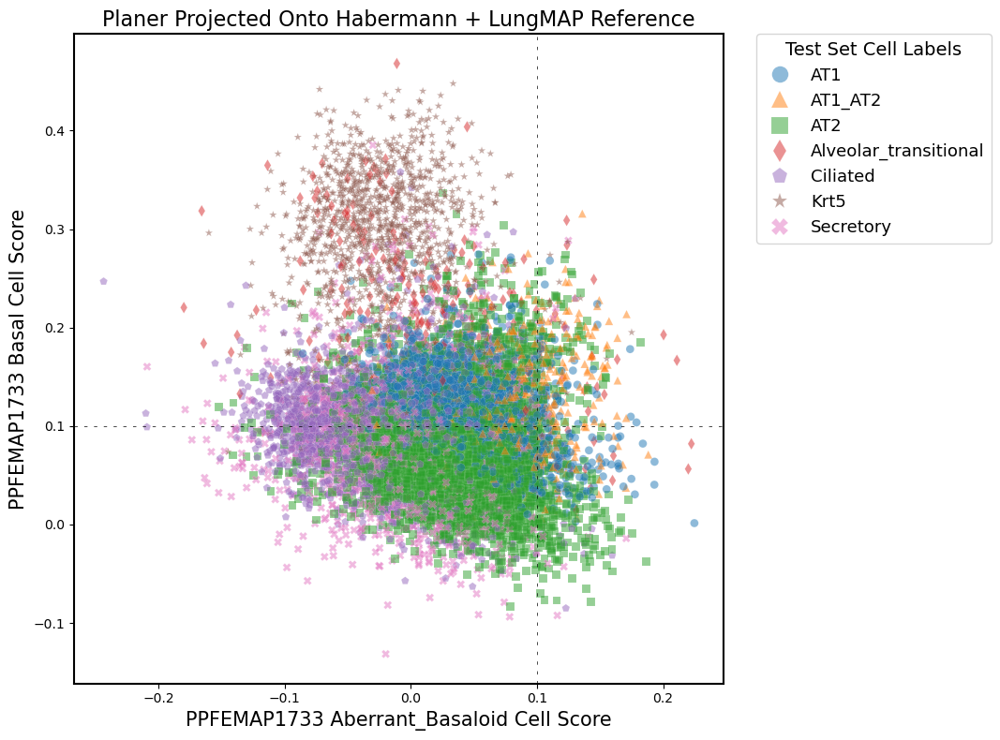

In [26]:
ax = SimilarityHelper.plotTwo(planer, "PPFEMAP1733", "Aberrant_Basaloid", "Basal",
                             title="Planer Projected Onto Habermann + LungMAP Reference",
                             # outFile="../PendingResults/Planer vs HaberMAP Full AT1 vs AT2.png",
)

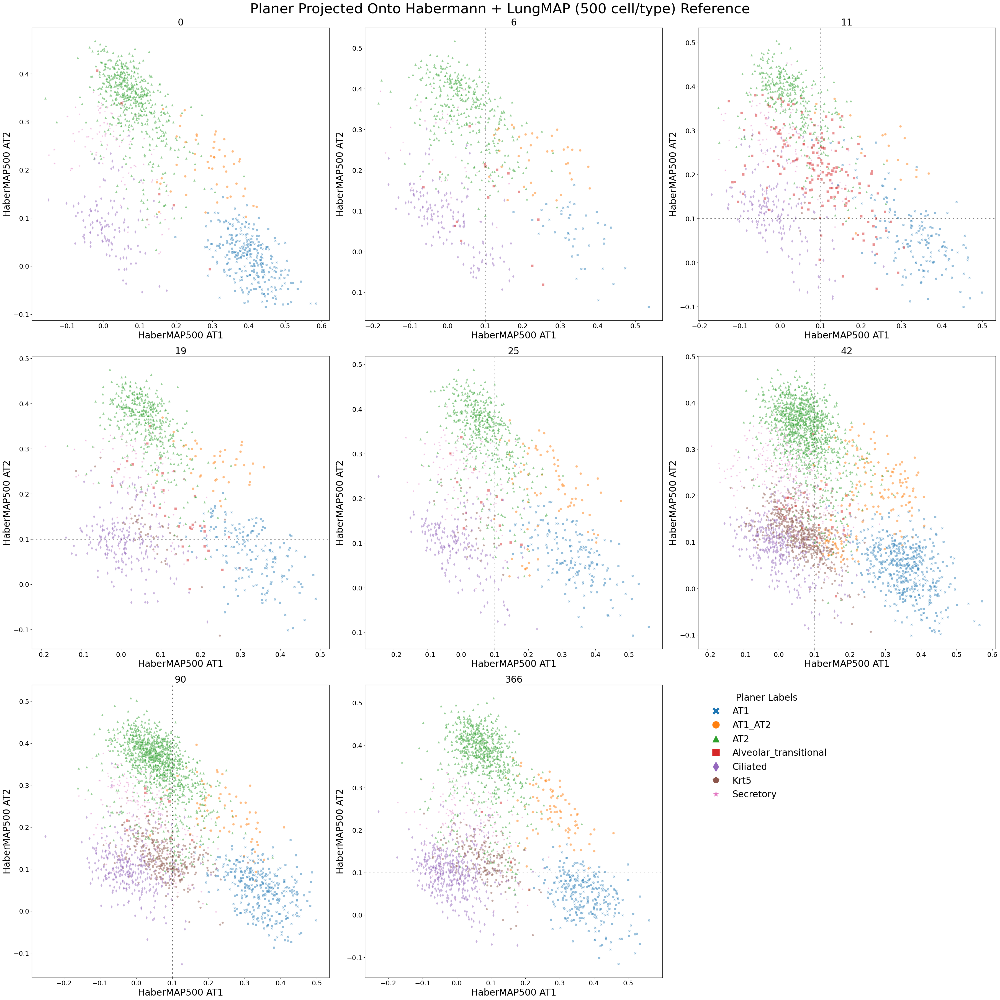

In [16]:
ax = SimilarityHelper.plotTwoMultiple(planer, "HaberMAP500", "AT1", "AT2",
                             title="Planer Projected Onto Habermann + LungMAP (500 cell/type) Reference",
                             outFile="../PendingResults/Planer vs HaberMAP 500 AT1 vs AT2.png",
)

# McCall

In [137]:
mcCall = TopObject.TopObject("McCall", skipProcess=True)
mcCall.getOrthologs(mapping, inplace=True)

Setting AnnData object...
Setting AnnData...
Setting metadata and df...
Finished setup!
Filtering AnnData object for orthologs...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Dropping duplicates...
Setting AnnData...
Setting metadata and df...
Done!


AnnData object with n_obs × n_vars = 15248 × 16204
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.mt', 'percent.ribo', 'nCount_SCT', 'nFeature_SCT', 'SCT_snn_res.0.9', 'seurat_clusters', 'RNA_snn_res.0.9', 'subcluster', 'subcluster1', 'subcluster2', 'subcluster3', 'celltype', 'celltype_rev'
    var: 'vst.mean', 'vst.variance', 'vst.variance.expected', 'vst.variance.standardized', 'vst.variable'
    obsm: 'X_harmony', 'X_pca', 'X_umap'
    layers: 'data'

In [138]:
mcCall.project(lungMAP2500, "LungMAP2500")
mcCall.project(lungMAP, "LungMAP")
# mcCall.project(habermann.combinedBases["LungMAP500"].drop(["Goblet", "Secretory"], axis=1), "HaberMAP500")
mcCall.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")

Projecting onto basis...
Processing scTOP data...
Finished projecting! 16051 genes were in both the source and basis.
Projecting onto basis...
Finished projecting! 924 genes were in both the source and basis.
Projecting onto basis...
Finished projecting! 15609 genes were in both the source and basis.


,AGGGTGACAAACGCGA-1_1,GCACTCTCACAGGCCT-1_1,GGGCATCAGCTCCTCT-1_1,CGTCCATGTGTGGCTC-1_1,GCTGCGACAGGCTCAC-1_1,GGGTCTGAGAATAGGG-1_1,AAGCCGCAGGCAATTA-1_1,TCCACACAGACTAAGT-1_1,TTAGGACTCTCCAACC-1_1,GCGCCAAAGAACAACT-1_1,...,GGTATTGCACGCGAAA-1_7,CGGAGTCGTTCAGGCC-1_7,AGGTCATAGACCTTTG-1_7,CAGTCCTGTGTCCTCT-1_7,ACATACGGTTCCACTC-1_7,CCTAAAGGTACCGTTA-1_7,TTGCCGTCACAGGAGT-1_7,TAAGAGAAGAGTCTGG-1_7,TGGGCGTTCACGACTA-1_7,GGAATAAGTATCTGCA-1_7
KRT5-/KRT17+,0.066042,-0.024054,0.091253,0.051554,0.071034,0.065727,0.058016,0.008537,0.028592,0.066176,...,0.087457,0.052322,0.147466,0.051468,0.072432,0.153547,0.070593,0.029838,0.125642,0.161567
AT1,-0.059668,-0.040867,0.060630,0.057612,0.050367,-0.046809,-0.051560,-0.014329,-0.014020,-0.055508,...,-0.025891,-0.035761,0.199339,0.118898,0.009598,0.067140,0.034610,-0.142946,0.112845,0.090790
AT2,0.428730,0.134661,0.328816,0.289053,0.340084,0.400409,0.405146,0.110127,0.094379,0.415829,...,0.097491,0.101667,-0.046904,0.098305,0.180410,0.005876,0.081024,0.213301,0.012379,-0.000174
Basal,0.074079,0.070021,0.137273,0.226686,0.006160,0.041971,0.040678,0.024349,0.049698,-0.006591,...,0.086385,0.018433,0.002745,0.002187,-0.063150,0.003350,0.026495,0.070851,0.034078,0.058291
Ciliated,-0.073921,0.721950,-0.067220,-0.072679,-0.050079,-0.043844,-0.046288,0.681915,0.633429,-0.016880,...,-0.017322,0.032298,-0.037339,0.015856,0.027953,0.012198,0.003160,0.038072,0.001815,0.009505
Goblet,0.185071,-0.027745,0.062793,0.065950,0.207301,0.135188,0.117636,-0.005684,0.044323,0.095527,...,-0.071357,0.036179,0.044683,-0.000256,0.002269,0.004535,0.046370,0.002442,-0.011064,-0.015582
Secretory,0.028753,-0.155157,0.017359,0.035415,0.003224,0.058991,0.042598,-0.154946,-0.174305,0.056666,...,0.102486,0.099219,-0.000599,-0.004548,0.055743,0.045018,0.047647,0.097669,0.017787,-0.002129


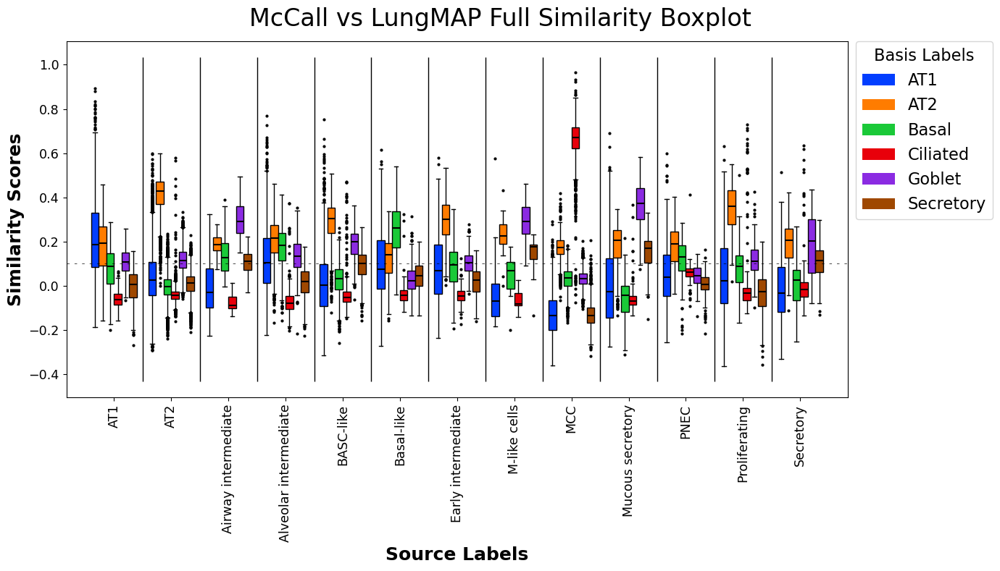

In [115]:
includeCriteria = None
SimilarityMap = SimilarityHelper.getMatchingProjections(mcCall, "LungMAP Full", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(SimilarityMap, 
        title="McCall vs LungMAP Full Similarity Boxplot",
        # outFile="../PendingResults/McCall vs LungMAP Full Boxplot.png"
)

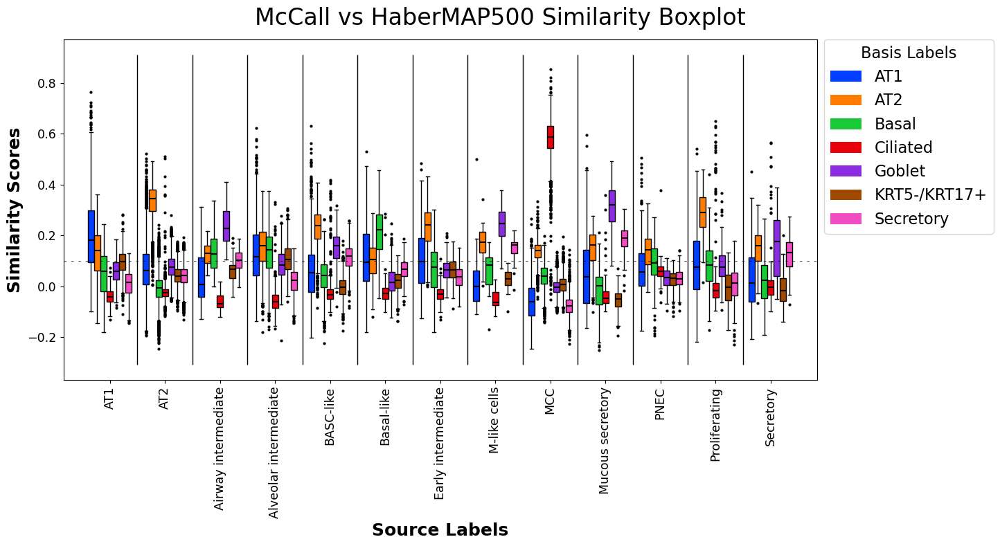

In [24]:
includeCriteria = None
SimilarityMap = SimilarityHelper.getMatchingProjections(mcCall, "HaberMAP500", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(SimilarityMap, 
        title="McCall vs HaberMAP500 Similarity Boxplot",
        # outFile="../PendingResults/McCall vs HaberMAP500 Boxplot.png"
)

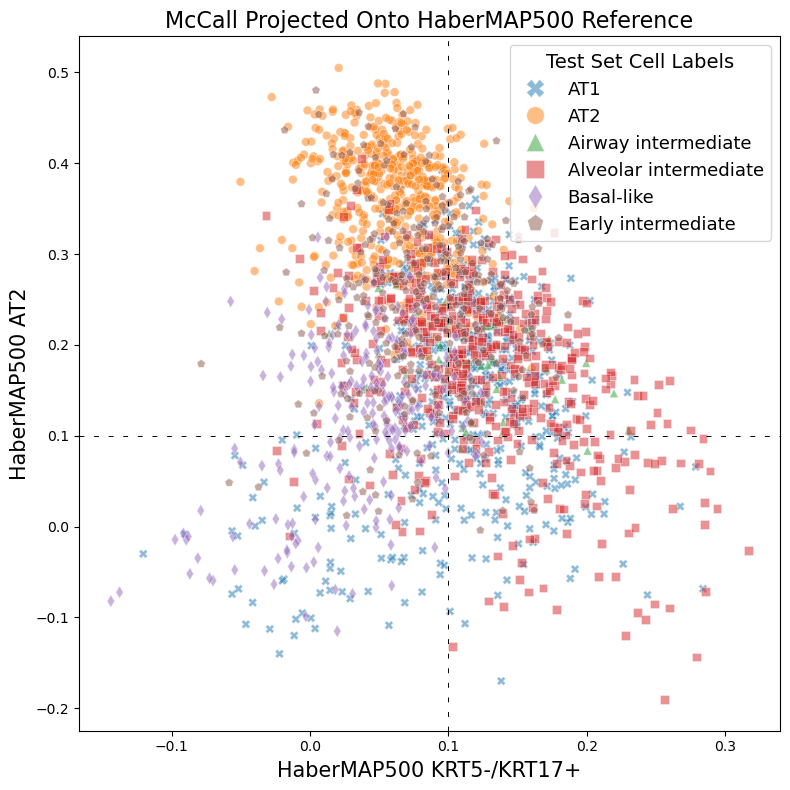

In [147]:
includeCriteria = mcCall.annotations.isin(["AT1", "AT2", "Airway intermediate", "Alveolar intermediate", "Basal-like", "Early intermediate"])
ax = SimilarityHelper.plotTwo(mcCall, "HaberMAP500", "KRT5-/KRT17+", "Basal",
                            includeCriteria=includeCriteria, maxLabelCount=5,
                             # outFile="../PendingResults/Planer vs HaberMAP Full AT1 vs AT2.png",
)

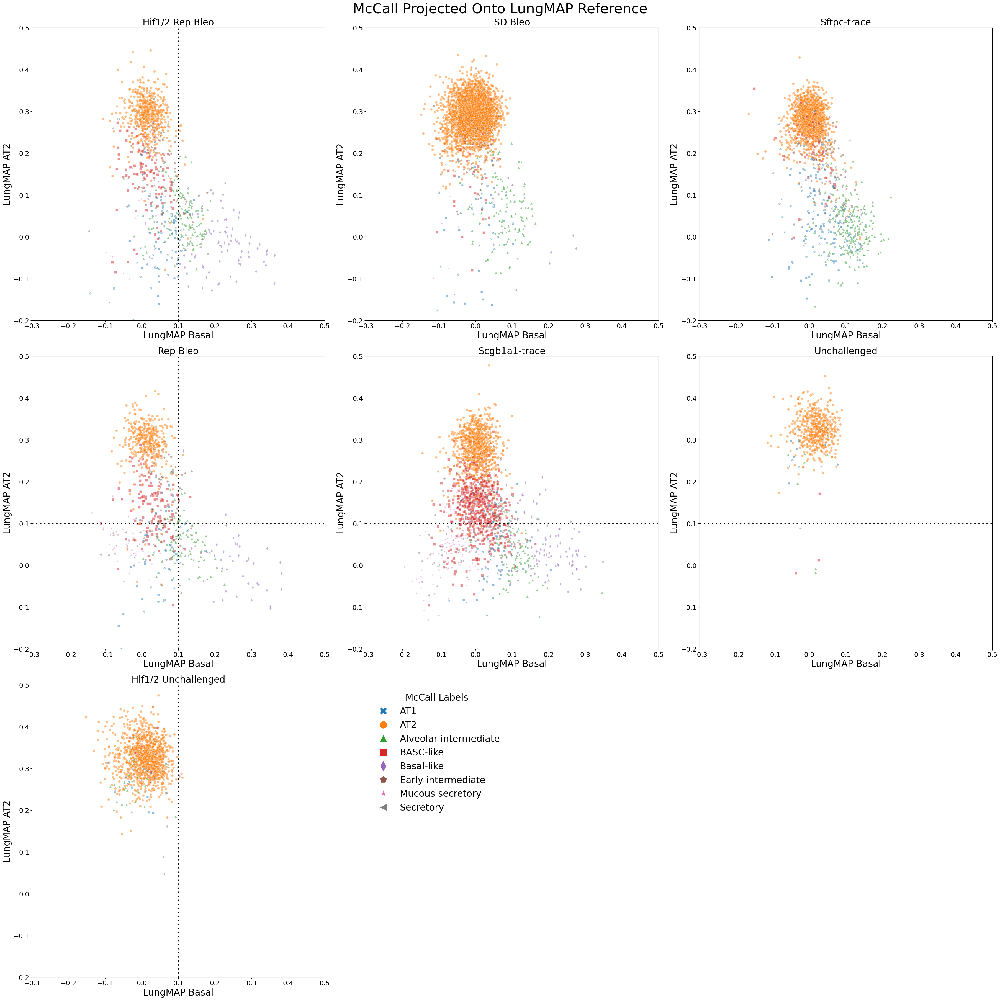

In [35]:
includeCriteria=mcCall.annotations.isin(["AT1", "AT2", "Alveolar intermediate", "Early intermediate", "Basal-like", "BASC-like", "Mucous secretory", "Secretory"])
ax = SimilarityHelper.plotTwoMultiple(mcCall, "LungMAP", "Basal", "AT2",
                         subsetCategory=mcCall.metadata["orig.ident"], subsetNames=list(set(mcCall.metadata["orig.ident"])),
                         includeCriteria=includeCriteria, xBounds=(-0.3, 0.5), yBounds=(-0.2, 0.5),
                         #maxLabelCount=1000, #unsupervisedContour=True, 
                         title="McCall Projected Onto LungMAP Reference", 
                         outFile="../PendingResults/McCall vs LungMAP Basal vs AT2 All Treatments.png",
)

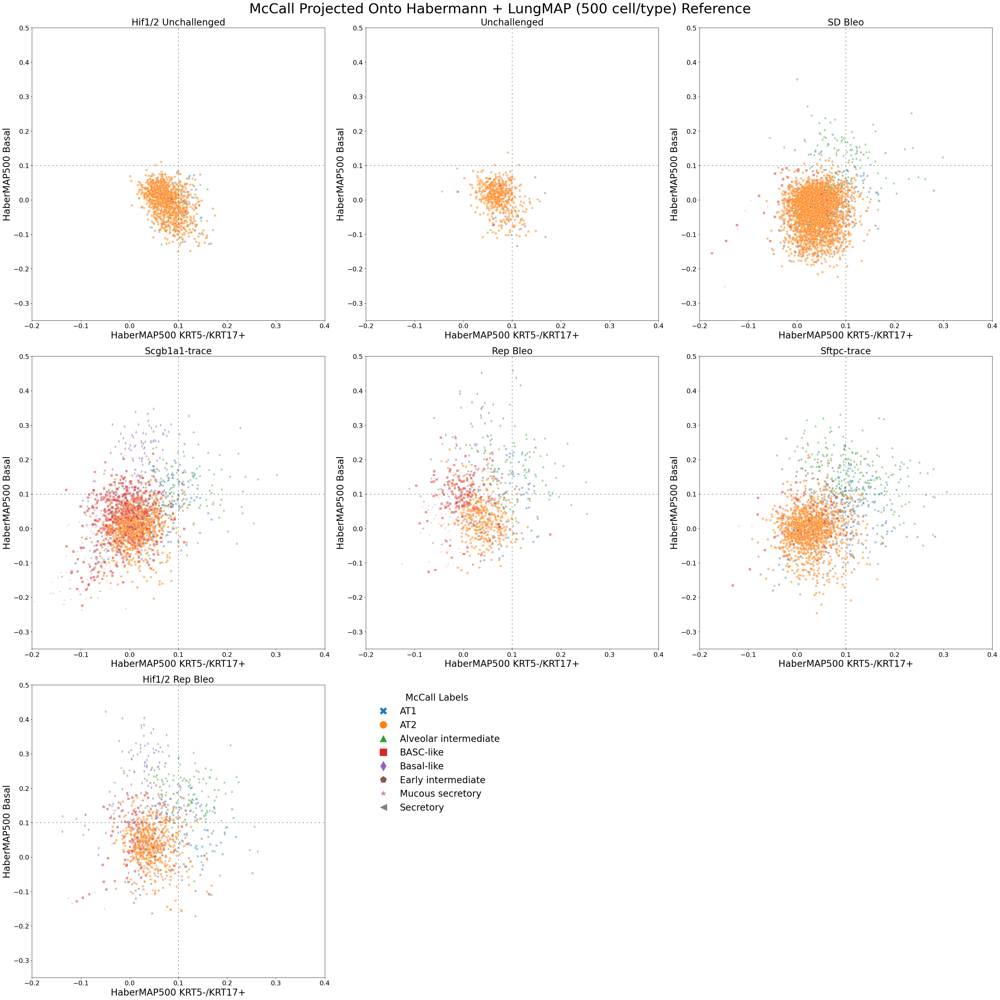

In [141]:
includeCriteria=mcCall.annotations.isin(["AT1", "AT2", "Alveolar intermediate", "Early intermediate", "Basal-like", "BASC-like", "Mucous secretory", "Secretory"])
ax = SimilarityHelper.plotTwoMultiple(mcCall, "HaberMAP500", "KRT5-/KRT17+", "Basal",
                         subsetCategory=mcCall.metadata["orig.ident"], subsetNames=list(set(mcCall.metadata["orig.ident"])),
                         includeCriteria=includeCriteria, xBounds=(-0.2, 0.4), yBounds=(-0.35, 0.5),
                         #maxLabelCount=1000, #unsupervisedContour=True, 
                         title="McCall Projected Onto Habermann + LungMAP (500 cell/type) Reference", 
                         outFile="../PendingResults/McCall vs HaberMAP 500 SKAR vs Basal All Treatments.png",
)

# Choi

In [75]:
choi = TopObject.TopObject("Choi", skipProcess=True)

Setting AnnData object...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/compat/__init__.py:371: FutureWarning:

Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.

/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/compat/__init__.py:371: FutureWarning:

Moving element from .uns['neighbors']['connectivities'] to .obsp['connectivities'].

This is where adjacency matrices should go now.

/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.

/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call

Making variable names unique...
Setting AnnData...
Setting metadata and df...
Consolidating duplicates...
Finished setup!


In [83]:
# "mt-Nd1" in choi.anndata.var
ann = ad.AnnData(X=csr_matrix(choi.df.T), obs=choi.metadata, var=pd.DataFrame(choi.df.index, index=choi.df.index), uns=choi.anndata.uns)
ann

AnnData object with n_obs × n_vars = 12086 × 18906
    obs: 'treat', 'n_counts', 'n_genes', 'louvain', 'doublet_score', 'anno', 'anno_2', 'anno_3', 'anno_4', 'anno_5', 'anno_final', 'anno_final_v2', 'L_predict', 'L_proba_AT1', 'L_proba_AT2', 'celltype', 'anno_final_v3', 'celltype_1', 'celltype_2', 'celltype_4'
    var: 'index'
    uns: 'anno_2_colors', 'anno_3_colors', 'anno_4_colors', 'anno_5_colors', 'anno_colors', 'anno_final_colors', 'anno_final_v2_colors', 'anno_final_v2_sizes', 'cdm', 'cdm_celltype', 'cdm_celltype_1', 'cdm_louvain', 'cdm_treat', 'celltype_1_colors', 'celltype_1_sizes', 'celltype_2_colors', 'celltype_colors', 'logistic', 'louvain', 'louvain_colors', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sim_doublet_score', 'treat_colors'

In [85]:
"mt-Nd1" in ann.var.index

True

In [86]:
choi.getOrthologs(mapping, inplace=True)

Filtering AnnData object for orthologs...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Setting AnnData...
Setting metadata and df...
Done!


AnnData object with n_obs × n_vars = 12086 × 13867
    obs: 'treat', 'n_counts', 'n_genes', 'louvain', 'doublet_score', 'anno', 'anno_2', 'anno_3', 'anno_4', 'anno_5', 'anno_final', 'anno_final_v2', 'L_predict', 'L_proba_AT1', 'L_proba_AT2', 'celltype', 'anno_final_v3', 'celltype_1', 'celltype_2', 'celltype_4'
    var: 'index'
    uns: 'anno_2_colors', 'anno_3_colors', 'anno_4_colors', 'anno_5_colors', 'anno_colors', 'anno_final_colors', 'anno_final_v2_colors', 'anno_final_v2_sizes', 'cdm', 'cdm_celltype', 'cdm_celltype_1', 'cdm_louvain', 'cdm_treat', 'celltype_1_colors', 'celltype_1_sizes', 'celltype_2_colors', 'celltype_colors', 'logistic', 'louvain', 'neighbors', 'paga', 'pca', 'rank_genes_groups', 'sim_doublet_score', 'treat_colors'

In [109]:
# choi.project(lungMAP2500.drop(["Goblet"], axis=1), "LungMAP2500")
# choi.project(lungMAP, "LungMAP")
choi.project(habermann.combinedBases["LungMAP500"].drop(["Goblet", "Secretory"], axis=1), "HaberMAP500")
# choi.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")

Projecting onto basis...
Finished projecting! 13739 genes were in both the source and basis.


index,SIGAA4-AAACCTGAGAGTGACC,SIGAA4-AAACCTGAGCGTTGCC,SIGAA4-AAACCTGAGCTCAACT,SIGAA4-AAACCTGCACTAAGTC,SIGAA4-AAACCTGCACTGTGTA,SIGAA4-AAACCTGCAGTCACTA,SIGAA4-AAACCTGCATGGTCAT,SIGAA4-AAACCTGGTAGAGTGC,SIGAA4-AAACCTGGTAGCGCTC,SIGAA4-AAACCTGGTTACCGAT,...,SIGAE4-TTTGCGCGTCAAACTC,SIGAE4-TTTGCGCTCCCTTGTG,SIGAE4-TTTGCGCTCGTTACGA,SIGAE4-TTTGCGCTCTGGAGCC,SIGAE4-TTTGGTTAGAGGGATA,SIGAE4-TTTGGTTCAGACAAGC,SIGAE4-TTTGGTTGTGTTCGAT,SIGAE4-TTTGTCACACAACGCC,SIGAE4-TTTGTCAGTGAGCGAT,SIGAE4-TTTGTCAGTTTGCATG
KRT5-/KRT17+,0.034902,0.068461,0.064510,0.089202,0.145583,0.065452,0.081818,0.047742,0.148587,0.108178,...,0.124325,0.082652,0.053649,0.100998,0.072971,0.027859,0.015859,0.097309,0.145992,0.055150
AT1,-0.079107,-0.006095,0.016645,-0.009167,-0.012405,-0.116783,0.031088,-0.126119,0.048618,-0.062780,...,-0.091673,-0.053707,-0.152735,-0.078140,-0.150952,-0.082799,-0.080765,-0.120439,0.050838,-0.088223
AT2,0.348403,0.245471,0.324167,0.383910,0.281741,0.417187,0.263763,0.435994,0.271938,0.338737,...,0.365633,0.354667,0.444926,0.322243,0.451535,0.367575,0.419904,0.439550,0.225558,0.435482
Basal,0.182733,0.066921,0.039571,0.054800,-0.016670,0.113534,-0.012226,0.135244,-0.014662,0.017226,...,0.147603,0.079471,0.163946,0.087708,0.090567,0.073126,0.164652,0.126009,-0.023332,0.161135
Ciliated,-0.010033,0.012339,-0.033378,-0.023961,-0.013070,0.005243,-0.026164,0.008058,-0.033699,-0.009287,...,-0.007117,0.031117,0.005214,-0.016818,0.022359,0.015646,0.017466,-0.035633,-0.046178,-0.020618


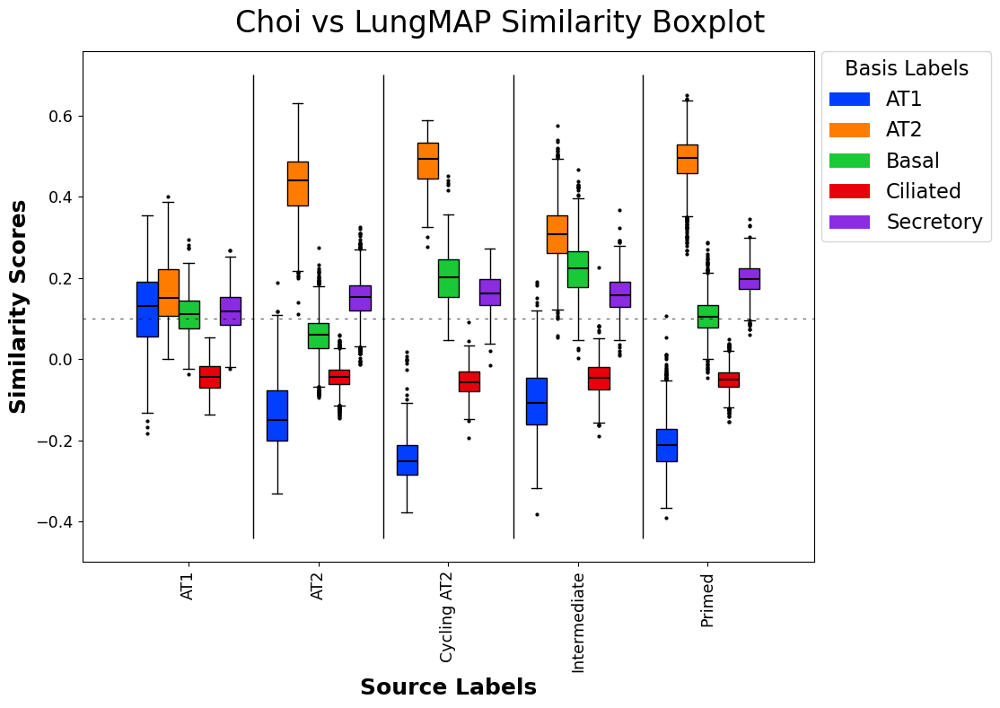

In [107]:
includeCriteria = None
SimilarityMap = SimilarityHelper.getMatchingProjections(choi, "LungMAP2500", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(SimilarityMap, 
        title="Choi vs LungMAP Similarity Boxplot",
        # outFile="../PendingResults/Choi vs LungMAP2500 Boxplot.png"
)

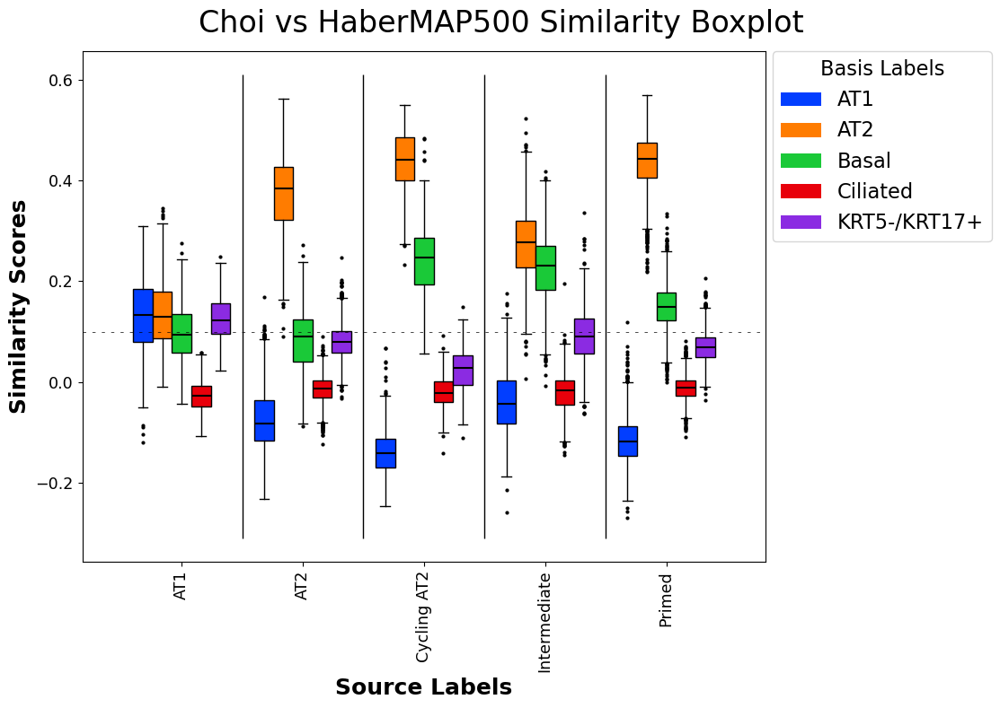

In [110]:
includeCriteria = None
SimilarityMap = SimilarityHelper.getMatchingProjections(choi, "HaberMAP500", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(SimilarityMap, 
        title="Choi vs HaberMAP500 Similarity Boxplot",
        # outFile="../PendingResults/Choi vs HaberMAP500 Boxplot.png"
)

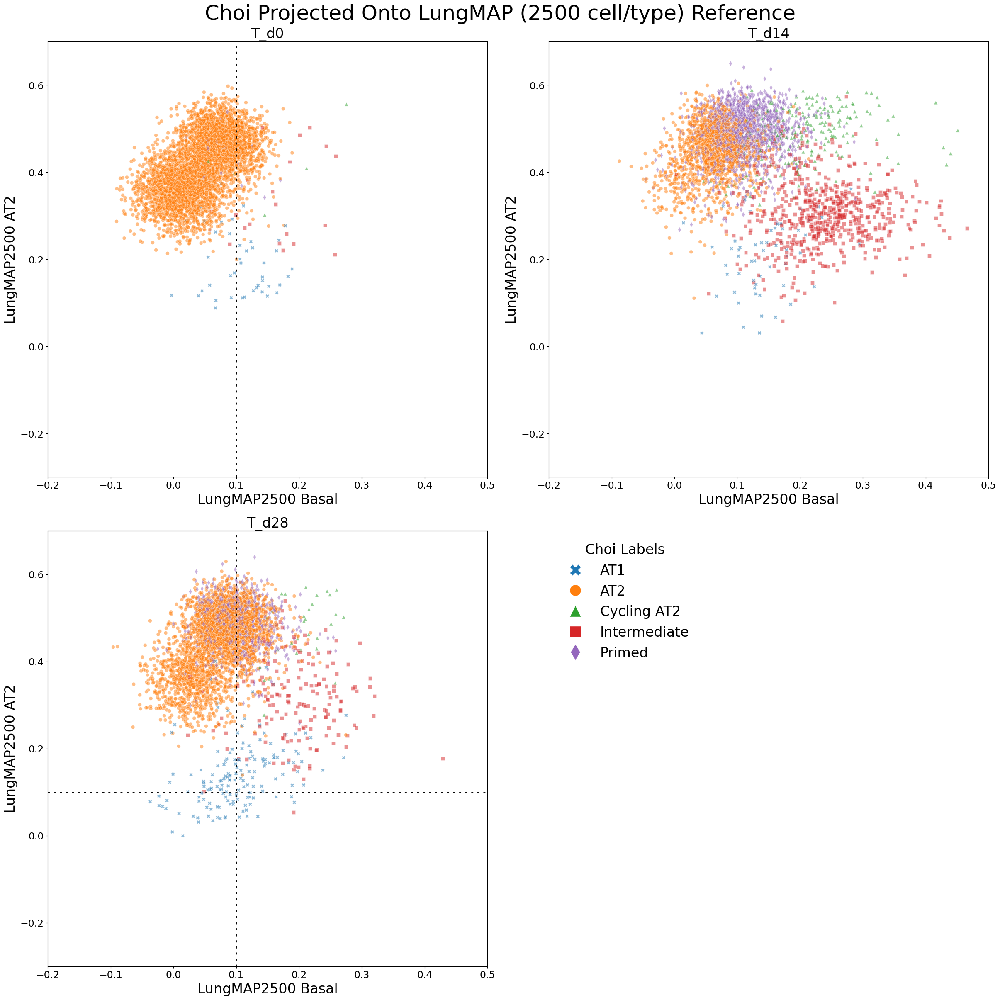

In [117]:
ax = SimilarityHelper.plotTwoMultiple(choi, "LungMAP2500", "Basal", "AT2",
                         includeCriteria=None, xBounds=(-0.2, 0.5), yBounds=(-0.3, 0.7),
                         #maxLabelCount=1000, #unsupervisedContour=True, 
                         title="Choi Projected Onto LungMAP (2500 cell/type) Reference", 
                         outFile="../PendingResults/Choi vs LungMAP 2500 Basal vs AT2.png",
)

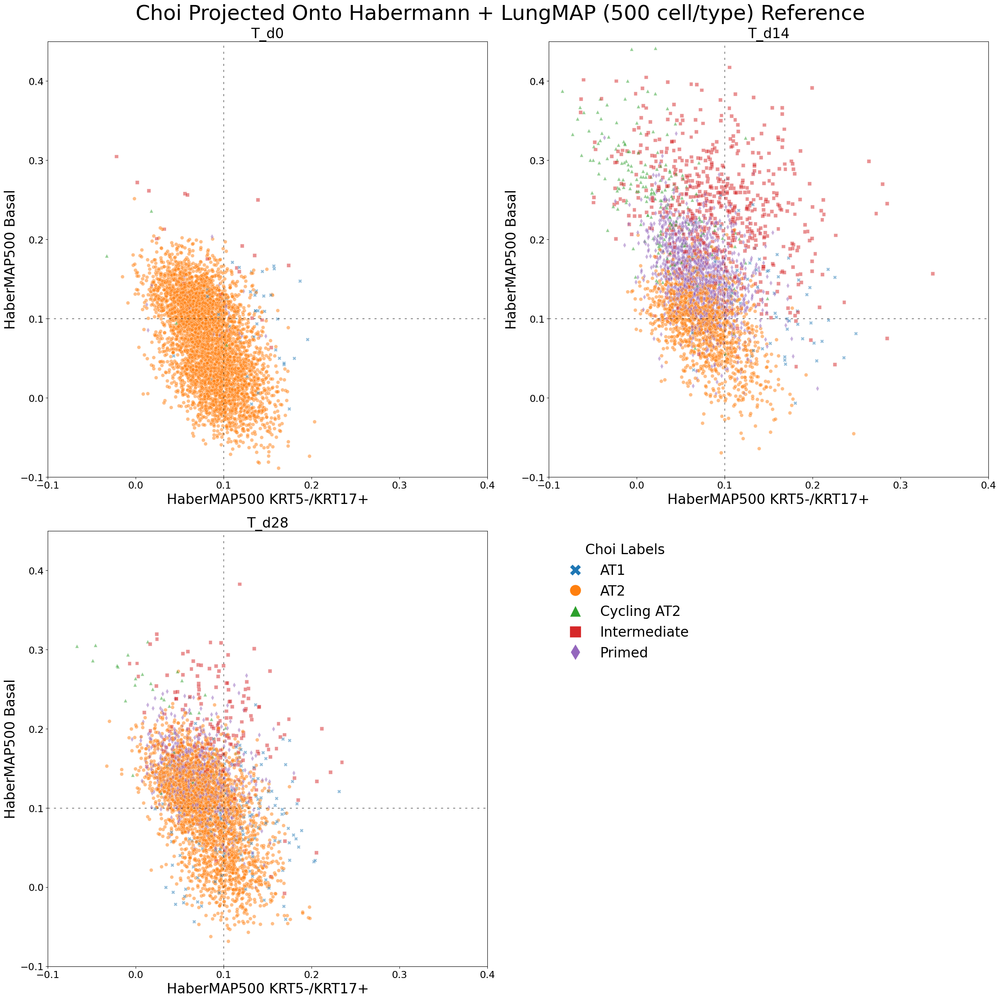

In [122]:
ax = SimilarityHelper.plotTwoMultiple(choi, "HaberMAP500", "KRT5-/KRT17+", "Basal",
                         includeCriteria=None, xBounds=(-0.1, 0.4), yBounds=(-0.1, 0.45),
                         #maxLabelCount=1000, #unsupervisedContour=True, 
                         title="Choi Projected Onto Habermann + LungMAP (500 cell/type) Reference", 
                         outFile="../PendingResults/Choi vs HaberMAP 500 SKAR vs Basal.png",
)

# Riemondy

In [127]:
riemondy = TopObject.TopObject("Riemondy")
riemondy.getOrthologs(mapping, inplace=True)

Setting AnnData object...
Setting AnnData...
Setting metadata and df...
Processing scTOP data...
Finished setup!
Filtering AnnData object for orthologs...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Dropping duplicates...
Setting AnnData...
Setting metadata and df...
Done!


AnnData object with n_obs × n_vars = 11020 × 15625
    obs: 'orig.ident', 'sample_names', 'expt', 'new_expt_id', 'proportion.mito', 'gfp_counts', 'res.1.6', 'res.0.3', 'res.0.6', 'res.0.9', 'res.1.2', 'res.1.5', 'res.1.8', 'labeled_clusters', 'nCount_RNA', 'nFeature_RNA', 'iAEC2.differentiation.8genes', 'iAEC2.maturation.5genes', 'differ_long', 'matura_long', 'Hb_AT1', 'Hb_AT2', 'Hb_B.Cells', 'Hb_Basal', 'Hb_cDCs', 'Hb_Ciliated', 'Hb_Differentiating.Ciliated', 'Hb_Endothelial.Cells', 'Hb_Fibroblasts', 'Hb_HAS1.High.Fibroblasts', 'Hb_KRT5neg.KRT17pos', 'Hb_Lymphatic.Endothelial.Cells', 'Hb_Macrophages', 'Hb_Mast.Cells', 'Hb_Mesothelial.Cells', 'Hb_Monocytes', 'Hb_MUC5ACpos.High', 'Hb_MUC5Bpos', 'Hb_Myofibroblasts', 'Hb_NK.Cells', 'Hb_pDCs', 'Hb_Plasma.Cells', 'Hb_PLIN2pos.Fibroblasts', 'Hb_Proliferating.Epithelial.Cells', 'Hb_Proliferating.Macrophages', 'Hb_Proliferating.T.Cells', 'Hb_SCGB3A2pos', 'Hb_SCGB3A2pos.SCGB1A1.', 'Hb_Smooth.Muscle.Cells', 'Hb_T.Cells', 'Hb_Transitional.AT2', '

In [128]:
# riemondy.project(lungMAP2500.drop(["Goblet"], axis=1), "LungMAP2500")
riemondy.project(lungMAP2500, "LungMAP2500")
riemondy.project(lungMAP, "LungMAP")
# riemondy.project(habermann.combinedBases["LungMAP500"].drop(["Goblet", "Secretory"], axis=1), "HaberMAP500")
riemondy.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")

Projecting onto basis...
Finished projecting! 15501 genes were in both the source and basis.
Projecting onto basis...
Finished projecting! 878 genes were in both the source and basis.
Projecting onto basis...
Finished projecting! 15476 genes were in both the source and basis.


index,ATI1expt1_AAACGGGAGTGTTTGC,ATI1expt1_AAAGTAGGTTCCACTC,ATI1expt1_AACCATGTCGAGAGCA,ATI1expt1_AACTCAGGTAAACCTC,ATI1expt1_AACTCTTCAAGCCCAC,ATI1expt1_AACTCTTGTATAATGG,ATI1expt1_AACTCTTGTCGTTGTA,ATI1expt1_AACTTTCGTAAGGGAA,ATI1expt1_AAGACCTAGATATGCA,ATI1expt1_AAGACCTAGTTAGGTA,...,ATII1expt2_TGGGCGTGTGCGATAG,ATII1expt2_TGGTTAGGTGGCCCTA,ATII1expt2_TGTCCCAAGTCGTACT,ATII1expt2_TGTTCCGAGCCCGAAA,ATII1expt2_TTAACTCCACGAAAGC,ATII1expt2_TTCCCAGCAGCTGTGC,ATII1expt2_TTGAACGGTGATAAGT,ATII1expt2_TTGCCGTGTCTTCAAG,ATII1expt2_TTGCGTCAGGCATGGT,ATII1expt2_TTTATGCTCAGGTAAA
KRT5-/KRT17+,0.182086,0.085214,0.050932,0.075796,0.067554,0.092463,0.065326,0.064060,0.075103,0.037583,...,0.127832,0.133276,0.081742,0.157879,0.151932,0.096945,0.122981,0.104034,0.163129,0.090519
AT1,-0.044230,-0.008596,-0.051010,-0.053964,-0.018132,-0.048872,-0.080488,-0.080941,-0.095565,-0.060755,...,-0.041048,-0.081292,-0.080179,-0.015544,-0.025627,-0.093514,-0.092645,-0.058209,0.045402,-0.071250
AT2,0.097510,0.077619,0.149216,0.153691,0.079251,0.118287,0.119409,0.154773,0.178891,0.130302,...,0.306767,0.326461,0.299164,0.263623,0.279518,0.350710,0.326191,0.312082,0.277699,0.265716
Basal,0.229582,0.179504,0.294662,0.096910,0.268568,0.084006,0.276861,0.169680,0.126940,0.216799,...,0.065472,0.045439,0.054919,0.074682,0.096166,0.090781,0.033381,0.019987,0.082673,0.052275
Ciliated,-0.031759,-0.026511,-0.023574,-0.024370,-0.008668,-0.029543,-0.018004,-0.014928,-0.019929,-0.006136,...,-0.003222,-0.033521,0.025549,-0.041808,-0.023817,-0.023392,-0.003626,-0.004887,-0.048976,0.000766
Goblet,0.008719,0.036403,0.016205,0.201438,-0.022524,0.159116,0.033217,0.140416,0.173488,0.069617,...,0.045524,0.032067,0.026577,0.012212,0.025207,0.039852,0.066807,0.067474,0.018314,-0.021636
Secretory,0.160655,0.137353,0.123647,0.181991,0.173854,0.250539,0.154990,0.151719,0.214626,0.142647,...,0.089430,0.116192,0.119066,0.106598,0.080665,0.108692,0.094595,0.092670,0.072747,0.119290


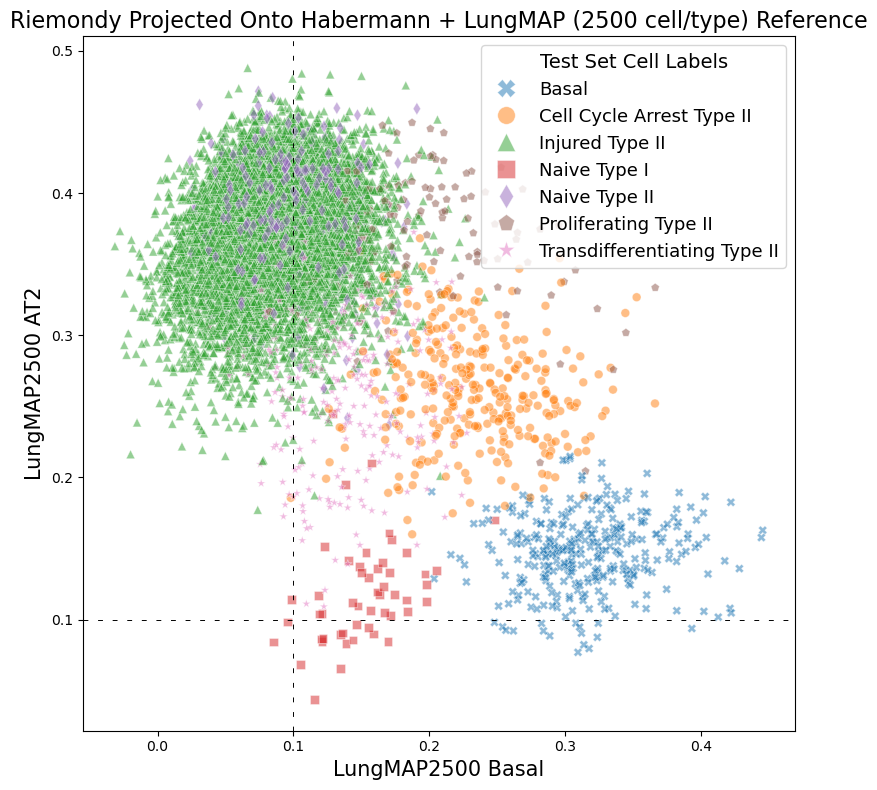

In [133]:
includeCriteria = riemondy.annotations.isin(riemondy.toKeep)
ax = SimilarityHelper.plotTwo(riemondy, "LungMAP2500", "Basal", "AT2",
                            includeCriteria=includeCriteria,
                            title="Riemondy Projected Onto Habermann + LungMAP (2500 cell/type) Reference",
                            outFile="../PendingResults/Riemondy vs LungMAP 2500 Basal vs AT2.png",
)

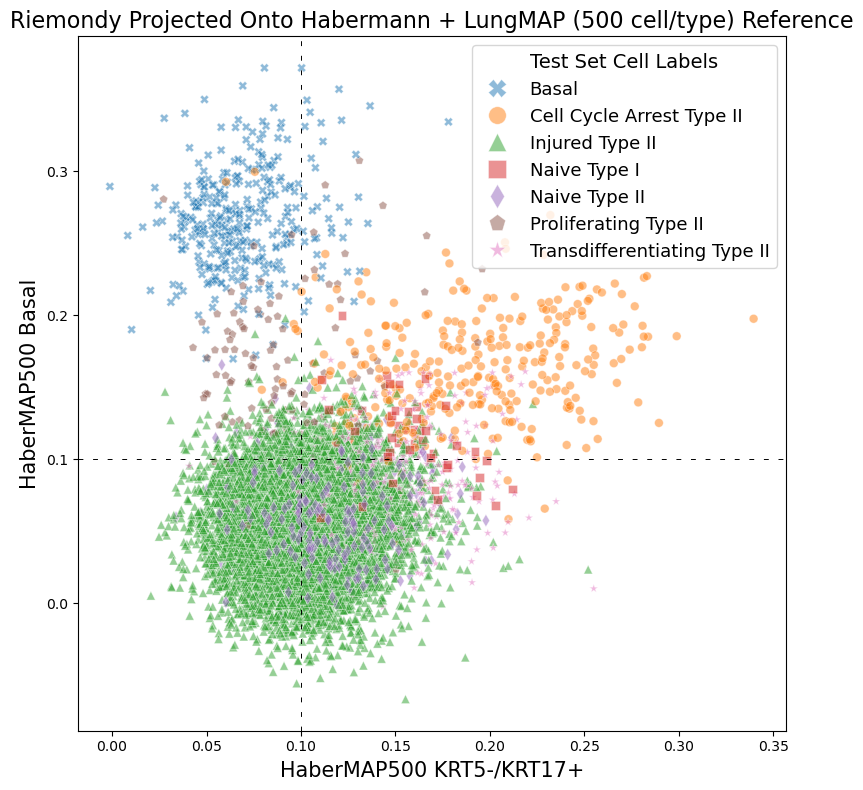

In [136]:
includeCriteria = riemondy.annotations.isin(riemondy.toKeep)
ax = SimilarityHelper.plotTwo(riemondy, "HaberMAP500", "KRT5-/KRT17+", "Basal",
                            includeCriteria=includeCriteria,
                            title="Riemondy Projected Onto Habermann + LungMAP (500 cell/type) Reference",
                            outFile="../PendingResults/Riemondy vs HaberMAP 500 SKAR vs Basal.png",
)

# Strunz

In [5]:
strunz = TopObject.TopObject("Strunz", skipProcess=True)
strunz.getOrthologs(mapping, inplace=True)

Setting AnnData object...
Setting AnnData...
Setting metadata and df...
Finished setup!
Filtering AnnData object for orthologs...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Dropping duplicates...
Setting AnnData...
Setting metadata and df...
Done!


AnnData object with n_obs × n_vars = 32559 × 15196
    obs: 'umap_1', 'umap_2', 'identifier', 'sample_id', 'time_point', 'louvain_cluster', 'cell_type', 'meta_celltype', 'percent_mito', 'n_counts', 'n_genes'

In [35]:
# strunz.project(HaberMAPANOVA1, "HaberMAP")
# strunz.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")
strunz.project(PPFEMAP1733, "PPFEMAP1733")


Projecting onto basis...
Finished projecting! 14321 genes were in both the source and basis.


index,muc9265_GAAGCCCTTCCT,muc9265_TATAATTCCCCC,muc9265_GTCTCGAGGTCC,muc9265_ATTCGCATTGTT,muc9265_TTTTCCCCTCCC,muc9265_GAAGAGGTGGCT,muc9265_TGAGAAGATGGA,muc9265_CCCTTATACATC,muc9265_AAAGGACGACAT,muc9265_GCCGGTCGACAC,...,muc9295_GAGTTGACCTCC,muc9296_GGCCCGTTCCCC,muc9296_ATGGGAAATGTT,muc9296_GGACGGCAATCC,muc9296_GAGCTACCTACC,muc9296_TTCTAACAGATA,muc9296_ACGGGGGTGTGA,muc9296_AATTGTAGCACA,muc9296_CCAAACCGCCTG,muc9296_AAGGGAGCTTTT
AT1,-0.007887,-0.063766,-0.030624,-0.016589,-0.018284,0.015345,-0.060516,-0.025916,-0.008986,-0.028823,...,0.005419,0.001940,-0.027721,-0.016993,-0.020318,-0.021471,-0.025843,-0.008412,-0.001849,-0.001455
AT2,0.105803,0.156605,0.108627,0.089258,0.121155,0.055544,0.105900,0.126200,0.023862,0.073648,...,0.045624,0.031345,0.070695,0.046762,0.095121,0.049607,0.055945,0.035691,0.023535,0.044559
Aberrant_Basaloid,-0.065899,-0.060842,-0.077972,-0.075306,-0.019776,-0.058172,-0.084750,-0.070506,-0.031985,-0.062703,...,-0.043183,-0.015868,-0.006102,-0.019231,-0.046499,-0.029526,-0.070907,-0.075442,-0.039750,-0.064639
Basal,0.057542,0.073894,0.095167,0.084794,0.014424,0.003732,0.063140,0.024470,0.034556,0.062493,...,0.011329,0.021235,0.049246,0.038869,0.088088,0.081989,0.030409,-0.005093,0.055437,0.078872
Ciliated,0.301400,0.271837,0.258166,0.254952,0.169712,0.268467,0.207352,0.086891,0.256653,0.237555,...,0.179317,0.334166,0.206232,0.301658,0.192606,0.168858,0.272289,0.253859,0.169721,0.205216
Goblet,0.014926,-0.035077,0.052179,0.000339,0.046204,0.048458,0.062883,0.012067,0.011912,-0.007129,...,0.027478,0.011186,0.054816,0.015958,0.028489,0.003432,0.010269,0.066350,0.009176,0.016267
Secretory,0.014366,0.015637,-0.024562,0.008650,0.023867,0.013619,0.028399,0.122903,0.028058,0.032109,...,0.058876,-0.069299,0.009248,-0.069067,-0.037631,0.002375,-0.029970,-0.018123,0.029086,-0.025336


Similarity map built!


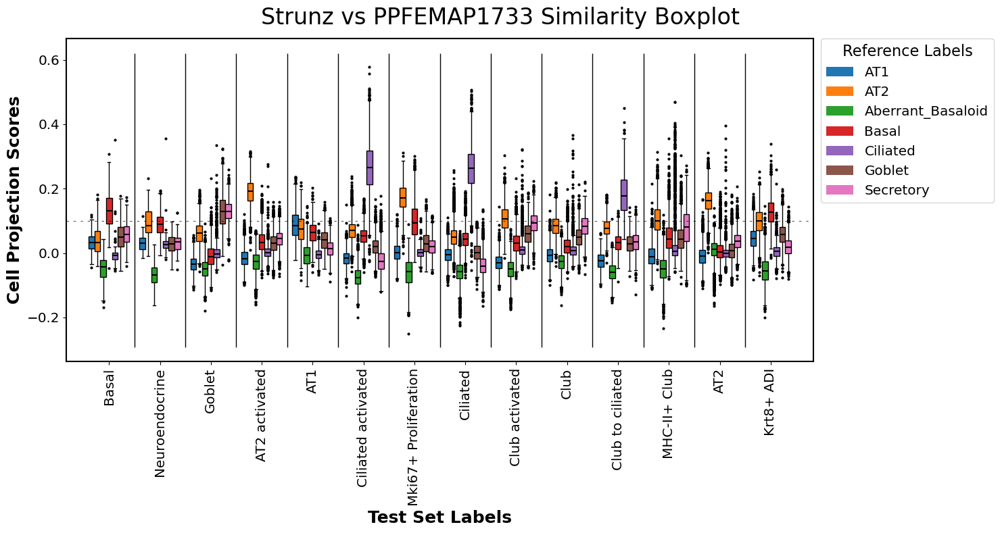

In [36]:
includeCriteria = None
strunzSimilarityMap = SimilarityHelper.getMatchingProjections(strunz, "PPFEMAP1733", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(strunzSimilarityMap, title="Strunz vs PPFEMAP1733 Similarity Boxplot", 
                                   # outFile="../PendingResults/Strunz vs HaberMAP 500 ANOVA Boxplot.png"
)

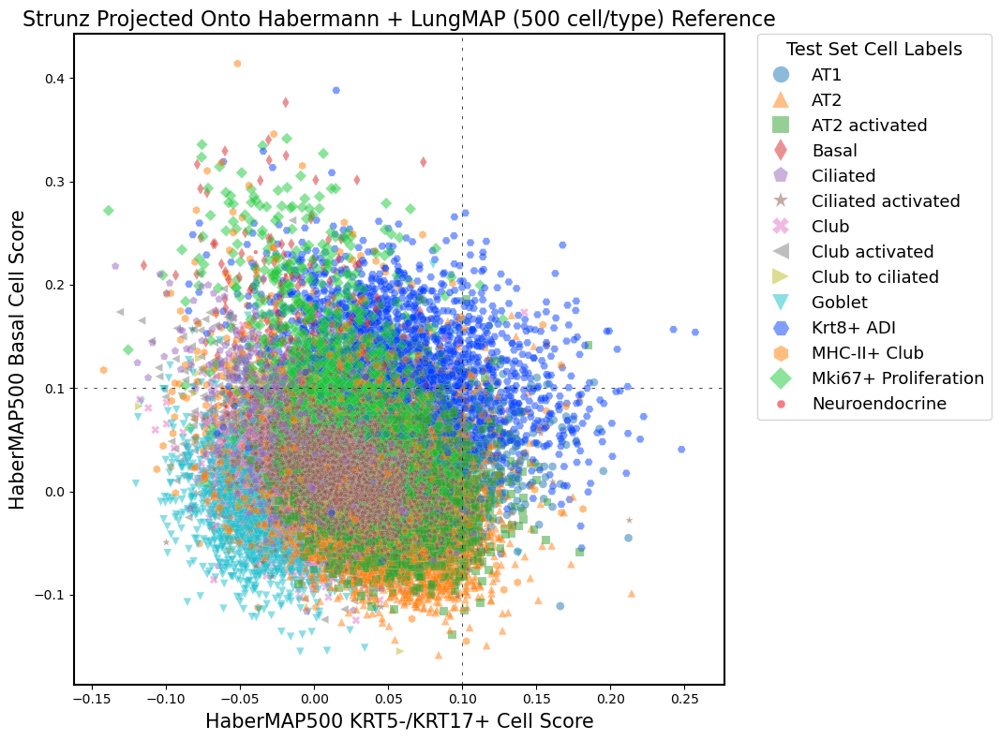

In [14]:
ax = SimilarityHelper.plotTwo(strunz, "HaberMAP500", "KRT5-/KRT17+", "Basal",
                            includeCriteria=None,
                            title="Strunz Projected Onto Habermann + LungMAP (500 cell/type) Reference",
                            # outFile="../PendingResults/Strunz vs HaberMAP 500 Basal vs AT2.png",
)

# Zacharias

In [5]:
zacharias = TopObject.TopObject("Zacharias", skipProcess=True)
zacharias.getOrthologs(mapping, inplace=True)

Setting AnnData object...
Setting AnnData...
Setting metadata and df...
Finished setup!
Filtering AnnData object for orthologs...


/restricted/projectnb/crem-trainees/Kotton_Lab/Eitan/.conda/envs/KottonLab/lib/python3.10/site-packages/anndata/_core/anndata.py:1758: UserWarning:

Variable names are not unique. To make them unique, call `.var_names_make_unique`.



Dropping duplicates...
Setting AnnData...
Setting metadata and df...
Done!


AnnData object with n_obs × n_vars = 74487 × 15249
    obs: 'DataSet', 'percent_mito', 'percent_ribo', 'percent_hb', 'seurat_clusters', 'pca.clusters', 'celltype', 'nCount_RNA', 'nFeature_RNA', 'nCount_counts', 'nFeature_counts'
    var: 'name'
    obsm: 'X_integrated.mnn', 'X_umap', 'X_umap_fastmnn'
    layers: 'data'

In [26]:
zacharias.project(habermann.combinedBases["LungMAP500"], "HaberMAP500")
# zacharias.project(HaberMAPANOVA1, "HaberMAPANOVA1")
# zacharias.project(HaberMAP500ANOVA2, "HaberMAP500ANOVA2")
# zacharias.project(lungMAP2500, "LungMAP2500")
# zacharias.project(lungMAP, "LungMAP")

Projecting onto basis...
Finished projecting! 14626 genes were in both the source and basis.


,2mo_Ctrl_AAACCAAAGGGCTTAC-1,2mo_Ctrl_AAACCAAAGTAGTGAA-1,2mo_Ctrl_AAACCAAAGTCATGTG-1,2mo_Ctrl_AAACCATTCAGGTGAG-1,2mo_Ctrl_AAACCATTCAGTAATC-1,2mo_Ctrl_AAACCATTCCTCGTCA-1,2mo_Ctrl_AAACCATTCGCTAATG-1,2mo_Ctrl_AAACCATTCTCACCAT-1,2mo_Ctrl_AAACCCTGTAAGTGGC-1,2mo_Ctrl_AAACCCTGTAGCTATC-1,...,9mo_KO_TGTGTACGTGATAGGC-1,9mo_KO_TGTGTACGTGATTGAG-1,9mo_KO_TGTGTACGTGGCGAAT-1,9mo_KO_TGTGTTAGTAACGCGG-1,9mo_KO_TGTGTTAGTGAGTGGT-1,9mo_KO_TGTGTTAGTTGGATGA-1,9mo_KO_TGTGTTGAGAAGCGGC-1,9mo_KO_TGTGTTGAGAAGGTAC-1,9mo_KO_TGTGTTGAGCTAACCA-1,9mo_KO_TGTGTTGAGTCAACTG-1
KRT5-/KRT17+,-0.028917,-0.003356,0.000146,0.032106,-0.058107,-0.006949,-0.064974,-0.021211,-0.007382,-0.034377,...,0.029772,-0.069286,0.001178,-0.036341,-0.021499,-0.111185,-0.055745,-0.031384,0.003935,-0.078265
AT1,0.163195,0.089497,0.127115,0.176131,0.197399,0.172336,0.447432,0.190131,0.176874,0.278436,...,0.274961,0.298911,0.297908,0.266983,0.360616,0.369840,0.351141,0.300723,0.283138,0.356267
AT2,0.355979,0.320332,0.348464,0.313639,0.373696,0.340526,0.183710,0.375527,0.366332,0.294334,...,0.004710,0.044617,-0.014875,0.003938,0.014288,0.054104,0.047599,0.000737,0.006814,0.047812
Basal,-0.000269,-0.061724,-0.065897,-0.094407,-0.104053,-0.082888,-0.149804,-0.065801,-0.114141,-0.067158,...,0.274375,0.196916,0.286426,0.298256,0.285621,0.303233,0.307195,0.217097,0.282353,0.376489
Ciliated,-0.018140,-0.026862,-0.022879,-0.028574,-0.033107,-0.032155,-0.023762,-0.064018,-0.065313,-0.031409,...,-0.046964,-0.003085,-0.070956,-0.035346,-0.036635,-0.073996,-0.056111,-0.048294,-0.027961,-0.079096
Goblet,0.020823,0.088476,0.051606,0.020736,0.116057,0.034218,-0.039113,0.062280,0.070862,0.004382,...,-0.056272,0.025628,-0.014988,-0.050953,-0.113744,-0.009199,-0.071818,-0.119544,-0.064554,-0.020429
Secretory,-0.002136,0.102490,0.054065,0.061508,0.045734,0.031027,-0.026159,0.059182,0.082789,0.046068,...,0.011234,-0.002651,0.026899,0.018990,0.013374,0.003315,-0.006820,0.052360,-0.006285,-0.023316


Similarity map built!


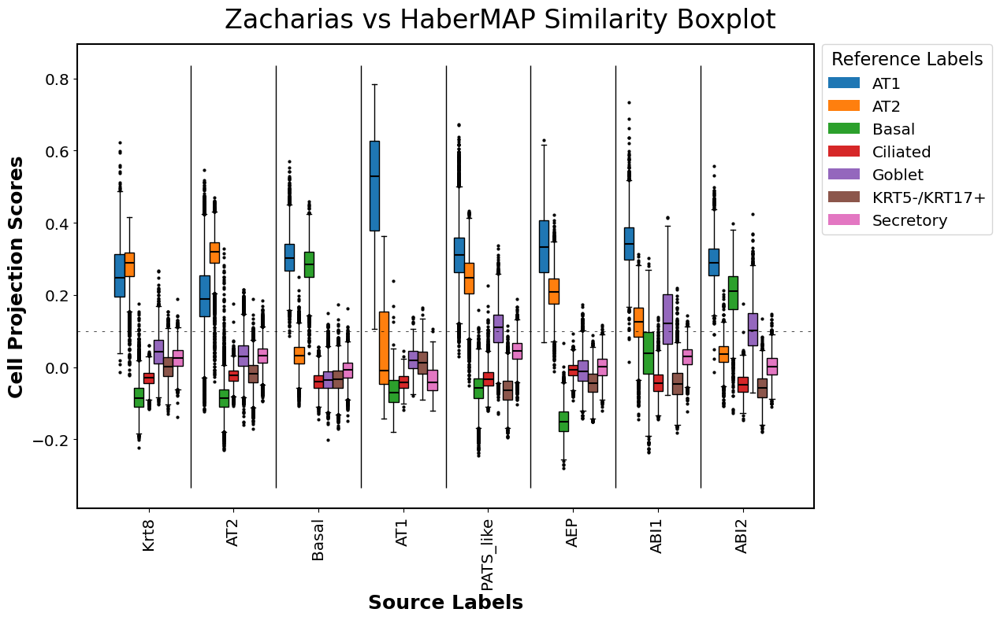

In [27]:
includeCriteria = None
zachariasSimilarityMap = SimilarityHelper.getMatchingProjections(zacharias, "HaberMAP500ANOVA2", includeCriteria=includeCriteria)
SimilarityHelper.similarityBoxplot(zachariasSimilarityMap, title="Zacharias vs HaberMAP Similarity Boxplot", 
                                   # outFile="../PendingResults/Zacharias vs HaberMAP 500 ANOVA Boxplot.png"
)

In [29]:
ax = SimilarityHelper.plotTwo(zacharias, "LungMAP2500", "Basal", "AT2",
                            includeCriteria=None,
                            title="Zacharias Projected Onto LungMAP (2500 cell/type) Reference",
                            # outFile="../PendingResults/Zacharias vs LungMAP 2500 Basal vs AT2.png",
)

NameError: name 'zacharias' is not defined

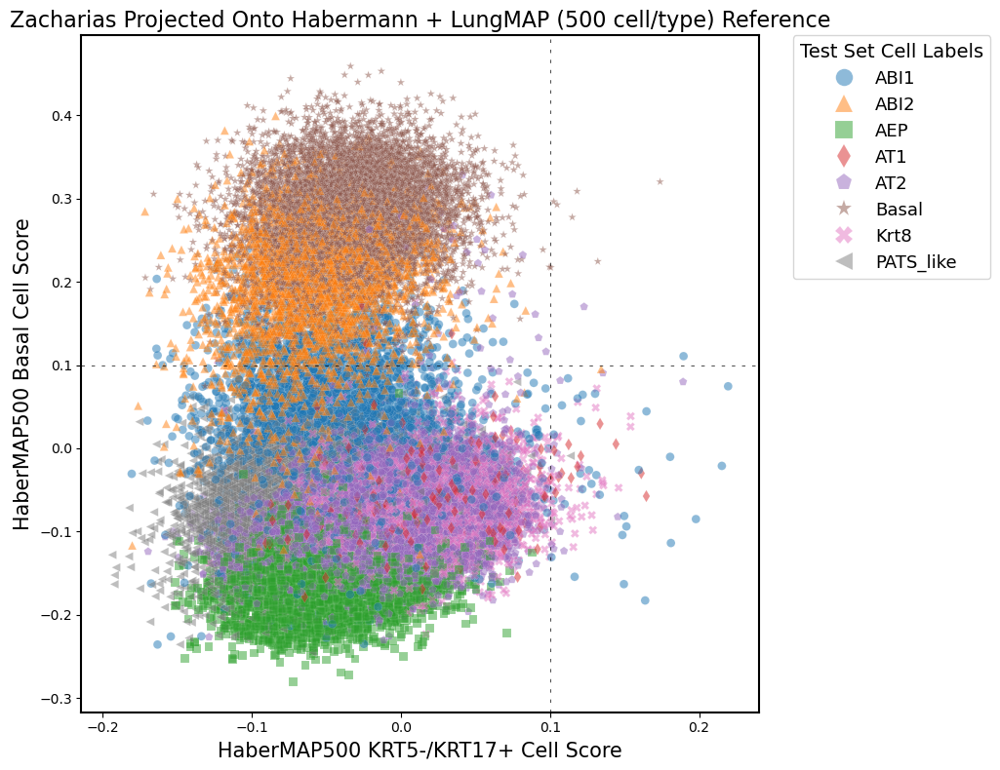

In [32]:
ax = SimilarityHelper.plotTwo(zacharias, "HaberMAP500", "KRT5-/KRT17+", "Basal",
                            includeCriteria=None,
                            title="Zacharias Projected Onto Habermann + LungMAP (500 cell/type) Reference",
                            # outFile="../PendingResults/Zacharias vs HaberMAP 500 Basal vs AT2.png",
)